In [1]:
%pylab inline
import os
import detect3D
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display')

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTask
figMsDir='/work/xiangchong.li/superonionGW/code/massMap_Private/doc/paper_ms_method_HSCY1/'

Populating the interactive namespace from numpy and matplotlib


In [2]:
cd wrkDir/sim/

/work/xiangchong.li/work/massMapSparse/sim


In [3]:
# Which halo to use
iz  =   0
im  =   7
isim=   8

In [4]:
lnm='nl20'
configName  =   'planck-cosmo/config-pix96-%s.ini' %lnm
parser      =   ConfigParser()
parser.read(configName)
gridInfo    =   cartesianGrid3D(parser)

hdir0='planck-cosmo/pix96-ns10/'
hdir=os.path.join(hdir0,'halo%d%d'%(iz,im))
odir='./' 

outfname0   =  os.path.join(hdir0,'pixsigma-%d%d.fits' %(iz,im))
outfname1   =  os.path.join(hdir,'pixShearR-g1-%d%d-sim%d.fits' %(iz,im,isim))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d%d-sim%d.fits' %(iz,im,isim))
outfname3   =  os.path.join(hdir0,'pixStd.fits')
assert os.path.isfile(outfname0)
assert os.path.isfile(outfname1)
assert os.path.isfile(outfname2)
assert os.path.isfile(outfname3)

In [5]:
outfname4   =  os.path.join(hdir0,'lensing_kernel_%s.fits' %lnm )
if not os.path.isfile(outfname4):
    print('preparing the lens kernel file')
    datDir='/work/xiangchong.li/work/S16ACatalogs/'
    tn='9347.fits'
    cfn='%s/S16AStandardCalibrated/tract/%s' %(datDir,tn)
    cdata=pyfits.getdata(cfn)
    poz_best=cdata['mlz_photoz_best']
    pfn='%s/S16AStandardCalibrated/tract/%s_pofz.fits' %(datDir,tn.split('.')[0])
    poz_data=pyfits.getdata(pfn)['PDF']
    bfn='%s/S16AStandardV2/field/pz_pdf_bins_mlz.fits' %datDir
    poz_bins=pyfits.getdata(bfn)['BINS']
    lensKernel= gridInfo.lensing_kernel(poz_grids=poz_bins,poz_data=poz_data,poz_best=poz_best)
    pyfits.writeto(outfname4,lensKernel,overwrite=True)
    for i in range(gridInfo.nzl):
        toPlt=lensKernel[:,i]
        norm=np.sqrt(np.sum(lensKernel[:,i]**2.))
        print(norm)

In [6]:
# configuration
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)
parser.set('file','outDir',odir)

print(parser.get('transPlane','smooth_scale'))
print(parser.get('prepare','g2fname'))


# Reconstruction Init
tau=0.
lbd=5.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','2' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
sparse3D    =   massmapSparsityTask(parser)

1.5
planck-cosmo/pix96-ns10/halo07/pixShearR-g2-07-sim8.fits


595003846197549.8
212786844941620.28
143772182251760.3
104917130068089.86
90375142107877.77
87102659660548.5
71579880978044.58
72461435202694.94


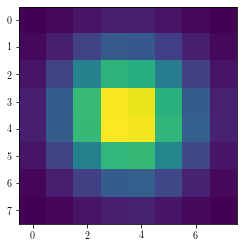

In [14]:
rshow=4
for i in range(8):
    sigmafname=   os.path.join(hdir0,'pixsigma-%d3.fits' %(i))
    Sigma=pyfits.getdata(sigmafname)
    toshow=Sigma[48-rshow:48+rshow,48-rshow:48+rshow]
    plt.imshow(toshow)
    print(np.abs(toshow).max())
    #print(np.average(toshow))

# sparse analysis

In [71]:
sparse3D.process(1200)

In [92]:
p=np.zeros(sparse3D.shapeA)
ss=sparse3D.alphaR*sparse3D._w

for izl in range(sparse3D.nlp):
    for ifr in range(sparse3D.nframe):
        if ifr==0:
            rsmth=0#int(4.2**(1.-izl/8.)+0.5)
        else:
            rsmth=0
        #print(rsmth)
        for jsh in range(-rsmth,rsmth+1):
            dif    =   np.roll(ss[izl,ifr],jsh,axis=-2)
            for ish in range(-rsmth,rsmth+1):
                dif2=   np.roll(dif,ish,axis=-1)
                p[izl,ifr] += dif2/(2.*rsmth+1.)#**2. snr

p=np.abs(p)

p=p/sparse3D._w/sparse3D.sigmaA

thres_adp=1./1e10
mask=(p>thres_adp)

w=np.zeros(sparse3D.shapeA)
w[mask]=1./(p[mask])**(2.)
w[~mask]=1./thres_adp
sparse3D.fista_gradient_descent(800,w=w)

In [93]:
sparse3D.reconstruct()
ipv.figure()
vol1=ipv.volshow(sparse3D.deltaR,level=[0.85,0.35,0.01],opacity=[1.,0.3,0.005],extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.01,0.85]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

0.0
0.21387282363963217


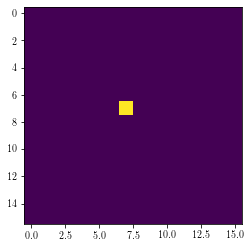

In [91]:
ishow=2
rshow=8
zl=gridInfo.zlcgrid[ishow]
rhoM_ave=gridInfo.cosmo.rho_m(zl)
DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[ishow],gridInfo.zlbound[ishow+1])
toshow=sparse3D.alphaR[ishow,1,48-rshow:48+rshow,48-rshow:48+rshow]#/sparse3D.mu#*ratio
plt.imshow(toshow)
print(toshow.min())
print(toshow.max())
#print(toshow)

In [35]:
hn='77'
sn='21'
fname='planck-cosmo/sparse-f3-3/halo%s/deltaR-sim%s-alasso2.fits' %(hn,sn)
data=pyfits.getdata(fname)
ipv.figure()
vol1=ipv.volshow(data,level=[0.90,0.35,0.01],opacity=[1.,0.3,0.005],extent=[[-48,48],[-48,48],[0.01,0.86]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png') 

/work/xiangchong.li/lsstsw/miniconda/envs/lsst-scipipe/lib/python3.7/site-packages/ipyvolume/serialize.py:92: RuntimeWarning: invalid value encountered in true_divide
  gradient = gradient / np.sqrt(gradient[0] ** 2 + gradient[1] ** 2 + gradient[2] ** 2)


0.0
-13.74889102296197


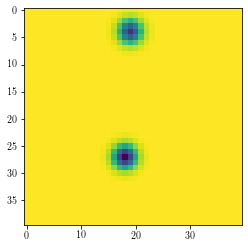

In [77]:
R=20
toshow=data[19,48-R:48+R,48-R:48+R]
imshow(toshow)
print(np.max(toshow))
print(np.min(toshow))

In [46]:
fname='toy-cosmo/sparse-f1/halo%s/deltaR-%s-sim%s-alasso2.fits' %(hn,hn,sn)
data=pyfits.getdata(fname)
ipv.figure()
vol1=ipv.volshow(data,level=[0.90,0.35,0.01],opacity=[1.,0.3,0.005],extent=[[-48,48],[-48,48],[0.01,0.86]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

0.15700000000000003
32.90921025735844
0.37425589913996427


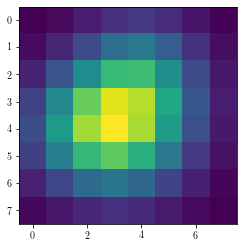

In [33]:
ishow=3
rshow=4
gridInfo    =   cartesianGrid3D(parser)
zl=gridInfo.zlcgrid[ishow]
rhoM_ave=gridInfo.cosmo.rho_m(zl)
DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[ishow],gridInfo.zlbound[ishow+1])
ratio=(rhoM_ave*DaBin)
toshow=data[ishow,48-rshow:48+rshow,48-rshow:48+rshow]#*ratio
plt.imshow(toshow)
print(gridInfo.zlcgrid[ishow])
print(np.abs(toshow).max())
print(toshow.min())

In [218]:
nmp='f3-1'
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp,iz,im))
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.

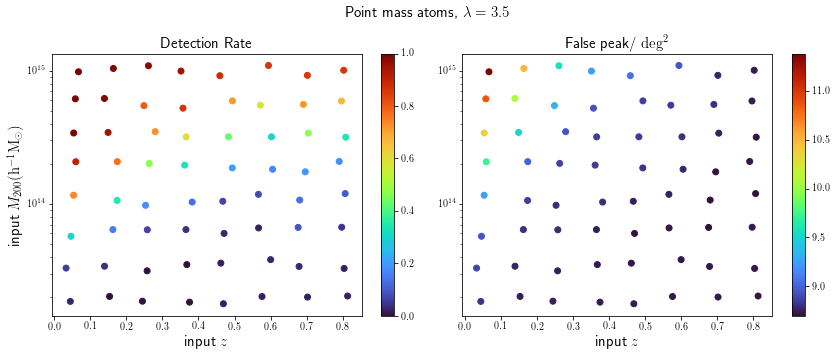

In [216]:
fig=plt.figure(figsize=(12,5))
fig.suptitle(r'NFW atoms, $\lambda=5.0$',fontsize=15)
ax=fig.add_subplot(1,2,1)
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='turbo')
plt.colorbar()
plt.title('Detection Rate',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

ax=fig.add_subplot(1,2,2)
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['falRat'],cmap='turbo')
plt.colorbar()
plt.title(r'False peak/ $\rm{deg}^2$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.yscale('log')
plt.tight_layout()
plt.savefig(os.path.join(figMsDir,'detfalseRate_f3-3.pdf'))

[ 0.98306751 -0.02515409] [0.0278587  0.00657019]


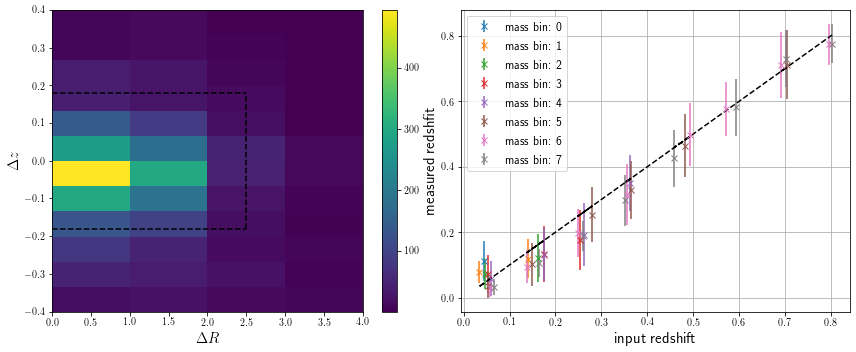

In [219]:
fig=plt.figure(figsize=(12,5))
ax=fig.add_subplot(1,2,1)

hist=np.zeros((4,12))
for i in range(8):
    for j in range(8):
        a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp,i,j))
        #a=a[a['value']>0.]
        dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
        dz=a['dZ']
        hist+=np.histogram2d(dr,dz,bins=(4,12),range=((0,4),(-0.4,0.4)),density=False)[0]
plt.imshow(hist.T,origin='lower',aspect='auto',extent=(0,4,-0.4,0.4))
plt.colorbar()
plt.plot(np.linspace(0,2.5,10),np.ones(10)*0.18,'--',c='black')
plt.plot(np.linspace(0,2.5,10),np.ones(10)*-0.18,'--',c='black')
plt.plot(np.ones(10)*2.5,np.linspace(-0.18,0.18,10),'--',c='black')
plt.xlabel(r'$\Delta R$',fontsize=15)
plt.ylabel(r'$\Delta z$',fontsize=15)


ax=fig.add_subplot(1,2,2)
cmap=plt.get_cmap('tab10')
catt=cat[cat['zMea']>0.]
plt.plot(catt['zh'],catt['zh'],'--',c='black')
for im in range(8):
    color=cmap(im)
    cc=catt[catt['im']==im]
    plt.errorbar(cc['zh'],cc['zMea'],cc['zErr'],fmt='x',c=color,label='mass bin: %d' %im)
p,cov=np.polyfit(catt['zh'].data,catt['zMea'].data,1,w=1./catt['zErr']*np.sqrt(catt['detRat']*100).data,cov=True)
print(p,np.sqrt(np.diag(cov)))
plt.legend(fontsize=12)
plt.tight_layout()
plt.xlabel(r'input redshift',fontsize=15)
plt.ylabel(r'measured redshfit',fontsize=15)
plt.grid()
plt.savefig(os.path.join(figMsDir,'peak_scatters_f3-1.pdf'))

In [189]:
x = catt['zh'].data
y = catt['zMea'].data.astype(np.float)
z = np.polyfit(x, y, 1)

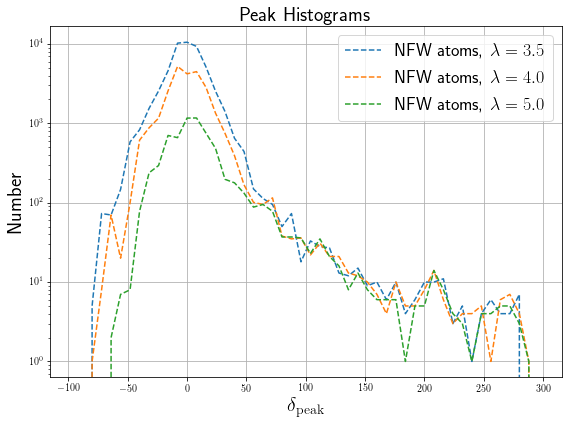

In [226]:
plt.figure(figsize=(8,6))
nmlist=['f3-1','f3-2','f3-3']
lblist=['NFW atoms, $\lambda=3.5$','NFW atoms, $\lambda=4.0$','NFW atoms, $\lambda=5.0$']

for inm,nmp2 in enumerate(nmlist):
    histP=np.zeros(50)
    for i in range(8):
        for j in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp2,i,j))
            histP+=np.histogram(a['value'],bins=50,range=(-100,300),density=False)[0]
    grids=np.histogram(a['value'],bins=50,range=(-100,300),density=False)[1]
    grids=(grids[1:]+grids[:-1])/2.
    plt.plot(grids,histP,'--',label=r'%s'%lblist[inm])
    plt.yscale('log')
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))